### Imports and Hyperparameters

In [2]:
import imgaug as ia
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import tensorflow as tf

root_path = os.path.abspath(os.path.join('..'))
if root_path not in sys.path:
    sys.path.append(root_path)

%matplotlib inline

In [3]:
IMAGE_SIZE = (320, 320)
CLASSES = ['background', 'qr_code']
SHUFFLE_BUFFER = 100
BATCH_SIZE = 16
NUM_EPOCHS = 50

### A visualization helper function

In [4]:
def display_image(image, boxes=None, box_color=[0, 0, 255], box_thickness=3, ax=None):
    image = np.array(image)
    
    if boxes is not None:
        boxes = np.array(boxes)[..., :5]
        boxes = [ia.BoundingBox(x1=x1, y1=y1, x2=x2, y2=y2, label=CLASSES[int(label)])
                 for x1, y1, x2, y2, label in boxes]
        boxes = ia.BoundingBoxesOnImage(boxes, shape=image.shape)
        image = boxes.draw_on_image(image, color=box_color,
                                    size=box_thickness)
    
    if ax is None:
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    else:
        ax.imshow(image)
        ax.axis('off')

### Load and visualize some image

Visualize some REAL images with their boxes for sanity checking 

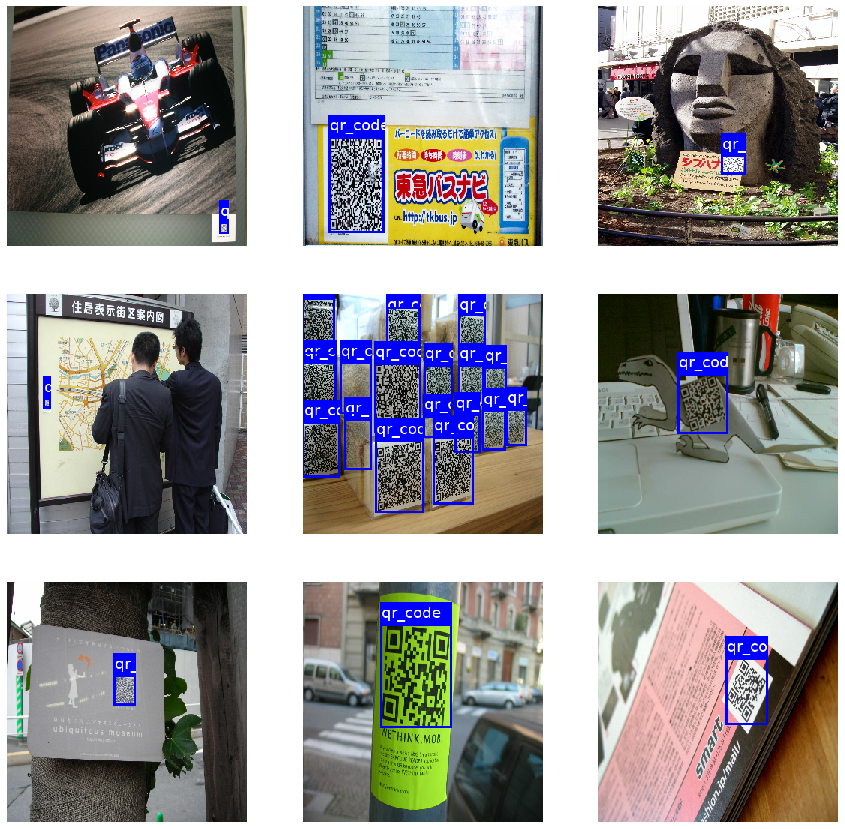

In [5]:
from qr_codes_loader import load_qr_codes_dataset, read_and_resize_image

train_data = load_qr_codes_dataset(split='train')
test_data = load_qr_codes_dataset(split='test')

num_display = 9
num_cols = 3
num_rows = (num_display+1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

#train_data = train_data.batch(10)
data_iter = iter(train_data)

for idx in range(num_display):
    x, y = next(data_iter)
    x, y = read_and_resize_image(x, y, new_size=IMAGE_SIZE)
    display_image(x, y.to_tensor(), ax=fig.axes[idx])
    
plt.show()

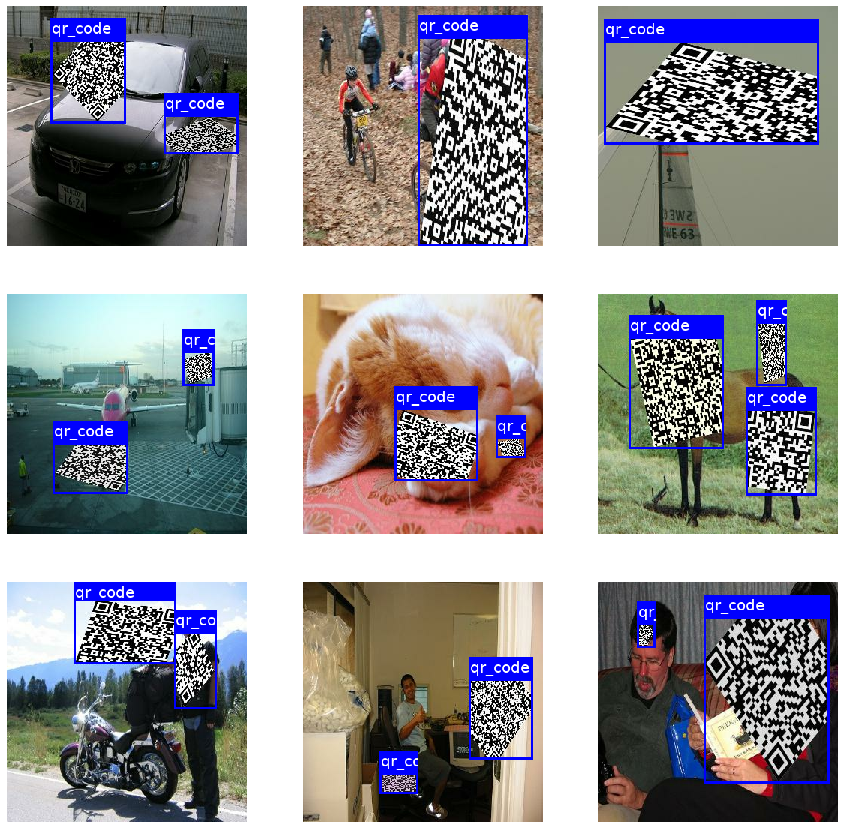

In [6]:
from qr_codes_loader import load_qr_codes_dataset, read_and_resize_image

fake_data = load_qr_codes_dataset(root='../data/qr_codes_fake', split='fake')

num_display = 9
num_cols = 3
num_rows = (num_display+1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

#train_data = train_data.batch(10)
data_iter = iter(fake_data)

for idx in range(num_display):
    x, y = next(data_iter)
    x, y = read_and_resize_image(x, y, new_size=IMAGE_SIZE)
    display_image(x, y.to_tensor(), ax=fig.axes[idx])
    
plt.show()

## MobileNet

### Instantiate the model

In [7]:
from ssd_utils.networks.ssd_mobilenet import SSDMobileNet

model = SSDMobileNet(num_classes=len(CLASSES), name='ssd_mobilenet')

### Encode the data for this model

In [8]:
from ssd_utils import output_encoder

anchors = model.get_anchors(image_shape=IMAGE_SIZE + (3,))

def encode(image, boxes):
    encoded = output_encoder.encode(boxes,
                                    anchors=anchors,
                                    model=model)
    return image, encoded

data_iter = iter(train_data)
x, y = next(data_iter)
x, y = read_and_resize_image(x, y, new_size=IMAGE_SIZE)
x, y = encode(x, y.to_tensor())
print(x.shape, y.shape)

(320, 320, 3) (3000, 6)


### Create the data pipelines

In [12]:
batched_fake_data = fake_data.repeat()
batched_fake_data = batched_fake_data.shuffle(SHUFFLE_BUFFER,
                                              reshuffle_each_iteration=True)
batched_fake_data = batched_fake_data.map(lambda x, y:
                read_and_resize_image(x, y, new_size=IMAGE_SIZE))
batched_fake_data = batched_fake_data.map(lambda x, y:
                tf.py_function(encode, [x, y.to_tensor()], [tf.uint8, tf.float32]))
batched_fake_data = batched_fake_data.batch(BATCH_SIZE).prefetch(5)

batched_train_data = train_data
batched_train_data = batched_train_data.shuffle(SHUFFLE_BUFFER,
                                              reshuffle_each_iteration=True)
batched_train_data = batched_train_data.map(lambda x, y:
                read_and_resize_image(x, y, new_size=IMAGE_SIZE))
batched_train_data = batched_train_data.map(lambda x, y:
                tf.py_function(encode, [x, y.to_tensor()], [tf.uint8, tf.float32]))
batched_train_data = batched_train_data.batch(BATCH_SIZE).prefetch(5)


batched_test_data = test_data.map(lambda x, y:
                read_and_resize_image(x, y, new_size=IMAGE_SIZE))
batched_test_data = batched_test_data.batch(BATCH_SIZE)

### Pretrain the model on fake data

In [10]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

ssd_loss = SSDLoss()
mean_AP_metric = MeanAveragePrecision()

class ValidationCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        for x, y_true in batched_test_data:
            predictions = [output_encoder.decode(y, anchors, model)
                            for y in model(x)]
            ground_truth = [y.to_tensor() for y in y_true]
            mean_AP_metric.update_state(ground_truth, predictions)
        
        logs['val_meanAP'] = mean_AP_metric.result()
        mean_AP_metric.reset_state()
        
ckpt_callback = ModelCheckpoint('baseline_mobilenet_pretrain.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer="adam", loss=ssd_loss, run_eagerly=True)

model.fit(batched_fake_data, epochs=NUM_EPOCHS, steps_per_epoch=30,
         callbacks=[ValidationCallback(), ckpt_callback])

Epoch 1/50
Instructions for updating:
Use tf.identity instead.
30/30 [==============================] - ETA: 0s - loss: 14.5387
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 491ms/step - loss: 14.5387 - val_meanAP: 0.0957
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 2.1447
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 581ms/step - loss: 2.1447 - val_meanAP: 0.3033
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 1.0494
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 514ms/step - loss: 1.0494 - val_meanAP: 0.3465
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 0.6967
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 497ms/step - loss: 0.6967 - val_meanAP: 0.4490
Epoch 5/50
30/30 [==============================] - ETA: 0s - loss: 0.5660
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 505ms/step - loss: 0.5660 - val_meanAP: 0.4673
Epoch 6/50
30/30 [==============================] - ETA: 0s - loss: 0.5142
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 493ms/step - loss: 0.5142 - val_meanAP: 0.5030
Epoch 7/50
30/30 [==============================] - ETA: 0s - loss: 0.4676
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 507ms/step - loss: 0.4676 - val_meanAP: 0.4820
Epoch 8/50
30/30 [==============================] - ETA: 0s - loss: 0.3902
Calculating Average Precision for class 1.0



30/30 [==============================] - 18s 603ms/step - loss: 0.3902 - val_meanAP: 0.4782
Epoch 9/50
30/30 [==============================] - ETA: 0s - loss: 0.3957
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 567ms/step - loss: 0.3957 - val_meanAP: 0.4516
Epoch 10/50
30/30 [==============================] - ETA: 0s - loss: 0.3564
Calculating Average Precision for class 1.0



30/30 [==============================] - 16s 540ms/step - loss: 0.3564 - val_meanAP: 0.4603
Epoch 11/50
30/30 [==============================] - ETA: 0s - loss: 0.3164
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 558ms/step - loss: 0.3164 - val_meanAP: 0.4448
Epoch 12/50
30/30 [==============================] - ETA: 0s - loss: 0.3015
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 503ms/step - loss: 0.3015 - val_meanAP: 0.4084
Epoch 13/50
30/30 [==============================] - ETA: 0s - loss: 0.2780
Calculating Average Precision for class 1.0



30/30 [==============================] - 16s 543ms/step - loss: 0.2780 - val_meanAP: 0.4161
Epoch 14/50
30/30 [==============================] - ETA: 0s - loss: 0.2820
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 550ms/step - loss: 0.2820 - val_meanAP: 0.4302
Epoch 15/50
30/30 [==============================] - ETA: 0s - loss: 0.2724
Calculating Average Precision for class 1.0



30/30 [==============================] - 21s 685ms/step - loss: 0.2724 - val_meanAP: 0.3912
Epoch 16/50
30/30 [==============================] - ETA: 0s - loss: 0.2736
Calculating Average Precision for class 1.0



30/30 [==============================] - 22s 722ms/step - loss: 0.2736 - val_meanAP: 0.4043
Epoch 17/50
30/30 [==============================] - ETA: 0s - loss: 0.2453
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 551ms/step - loss: 0.2453 - val_meanAP: 0.4175
Epoch 18/50
30/30 [==============================] - ETA: 0s - loss: 0.2370
Calculating Average Precision for class 1.0



30/30 [==============================] - 19s 638ms/step - loss: 0.2370 - val_meanAP: 0.4280
Epoch 19/50
30/30 [==============================] - ETA: 0s - loss: 0.2560
Calculating Average Precision for class 1.0



30/30 [==============================] - 19s 637ms/step - loss: 0.2560 - val_meanAP: 0.4471
Epoch 20/50
30/30 [==============================] - ETA: 0s - loss: 0.2552
Calculating Average Precision for class 1.0



30/30 [==============================] - 16s 541ms/step - loss: 0.2552 - val_meanAP: 0.4321
Epoch 21/50
30/30 [==============================] - ETA: 0s - loss: 0.2145
Calculating Average Precision for class 1.0



30/30 [==============================] - 20s 652ms/step - loss: 0.2145 - val_meanAP: 0.4314
Epoch 22/50
30/30 [==============================] - ETA: 0s - loss: 0.2033
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 565ms/step - loss: 0.2033 - val_meanAP: 0.4265
Epoch 23/50
30/30 [==============================] - ETA: 0s - loss: 0.1807
Calculating Average Precision for class 1.0



30/30 [==============================] - 16s 520ms/step - loss: 0.1807 - val_meanAP: 0.4554
Epoch 24/50
30/30 [==============================] - ETA: 0s - loss: 0.1837
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 493ms/step - loss: 0.1837 - val_meanAP: 0.4494
Epoch 25/50
30/30 [==============================] - ETA: 0s - loss: 0.1778
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 565ms/step - loss: 0.1778 - val_meanAP: 0.4409
Epoch 26/50
30/30 [==============================] - ETA: 0s - loss: 0.1695
Calculating Average Precision for class 1.0



30/30 [==============================] - 22s 746ms/step - loss: 0.1695 - val_meanAP: 0.4599
Epoch 27/50
30/30 [==============================] - ETA: 0s - loss: 0.1677
Calculating Average Precision for class 1.0



30/30 [==============================] - 18s 610ms/step - loss: 0.1677 - val_meanAP: 0.4653
Epoch 28/50
30/30 [==============================] - ETA: 0s - loss: 0.1779
Calculating Average Precision for class 1.0



30/30 [==============================] - 16s 526ms/step - loss: 0.1779 - val_meanAP: 0.4650
Epoch 29/50
30/30 [==============================] - ETA: 0s - loss: 0.1642
Calculating Average Precision for class 1.0



30/30 [==============================] - 16s 529ms/step - loss: 0.1642 - val_meanAP: 0.4436
Epoch 30/50
30/30 [==============================] - ETA: 0s - loss: 0.1753
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 500ms/step - loss: 0.1753 - val_meanAP: 0.4421
Epoch 31/50
30/30 [==============================] - ETA: 0s - loss: 0.1721
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 502ms/step - loss: 0.1721 - val_meanAP: 0.4390
Epoch 32/50
30/30 [==============================] - ETA: 0s - loss: 0.1517
Calculating Average Precision for class 1.0



30/30 [==============================] - 17s 575ms/step - loss: 0.1517 - val_meanAP: 0.4566
Epoch 33/50
30/30 [==============================] - ETA: 0s - loss: 0.1555
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 491ms/step - loss: 0.1555 - val_meanAP: 0.4381
Epoch 34/50
30/30 [==============================] - ETA: 0s - loss: 0.1409
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 458ms/step - loss: 0.1409 - val_meanAP: 0.4599
Epoch 35/50
30/30 [==============================] - ETA: 0s - loss: 0.1390
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 459ms/step - loss: 0.1390 - val_meanAP: 0.4286
Epoch 36/50
30/30 [==============================] - ETA: 0s - loss: 0.1382
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 457ms/step - loss: 0.1382 - val_meanAP: 0.4325
Epoch 37/50
30/30 [==============================] - ETA: 0s - loss: 0.1388
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 459ms/step - loss: 0.1388 - val_meanAP: 0.4540
Epoch 38/50
30/30 [==============================] - ETA: 0s - loss: 0.1427
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 455ms/step - loss: 0.1427 - val_meanAP: 0.4575
Epoch 39/50
30/30 [==============================] - ETA: 0s - loss: 0.1455
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 458ms/step - loss: 0.1455 - val_meanAP: 0.4639
Epoch 40/50
30/30 [==============================] - ETA: 0s - loss: 0.1815
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 453ms/step - loss: 0.1815 - val_meanAP: 0.4576
Epoch 41/50
30/30 [==============================] - ETA: 0s - loss: 0.1500
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 454ms/step - loss: 0.1500 - val_meanAP: 0.4554
Epoch 42/50
30/30 [==============================] - ETA: 0s - loss: 0.1491
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 459ms/step - loss: 0.1491 - val_meanAP: 0.4427
Epoch 43/50
30/30 [==============================] - ETA: 0s - loss: 0.1339
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 452ms/step - loss: 0.1339 - val_meanAP: 0.4664
Epoch 44/50
30/30 [==============================] - ETA: 0s - loss: 0.1346
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 457ms/step - loss: 0.1346 - val_meanAP: 0.4645
Epoch 45/50
30/30 [==============================] - ETA: 0s - loss: 0.1299
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 455ms/step - loss: 0.1299 - val_meanAP: 0.4572
Epoch 46/50
30/30 [==============================] - ETA: 0s - loss: 0.1203
Calculating Average Precision for class 1.0



30/30 [==============================] - 14s 465ms/step - loss: 0.1203 - val_meanAP: 0.4589
Epoch 47/50
30/30 [==============================] - ETA: 0s - loss: 0.1210
Calculating Average Precision for class 1.0



30/30 [==============================] - 35s 1s/step - loss: 0.1210 - val_meanAP: 0.4573
Epoch 48/50
30/30 [==============================] - ETA: 0s - loss: 0.1229
Calculating Average Precision for class 1.0



30/30 [==============================] - 32s 1s/step - loss: 0.1229 - val_meanAP: 0.4630
Epoch 49/50
30/30 [==============================] - ETA: 0s - loss: 0.1253
Calculating Average Precision for class 1.0



30/30 [==============================] - 38s 1s/step - loss: 0.1253 - val_meanAP: 0.4544
Epoch 50/50
30/30 [==============================] - ETA: 0s - loss: 0.1275
Calculating Average Precision for class 1.0



30/30 [==============================] - 15s 499ms/step - loss: 0.1275 - val_meanAP: 0.4537



Calculating Average Precision for class 1.0



Validation meanAP: 0.5030025456354362


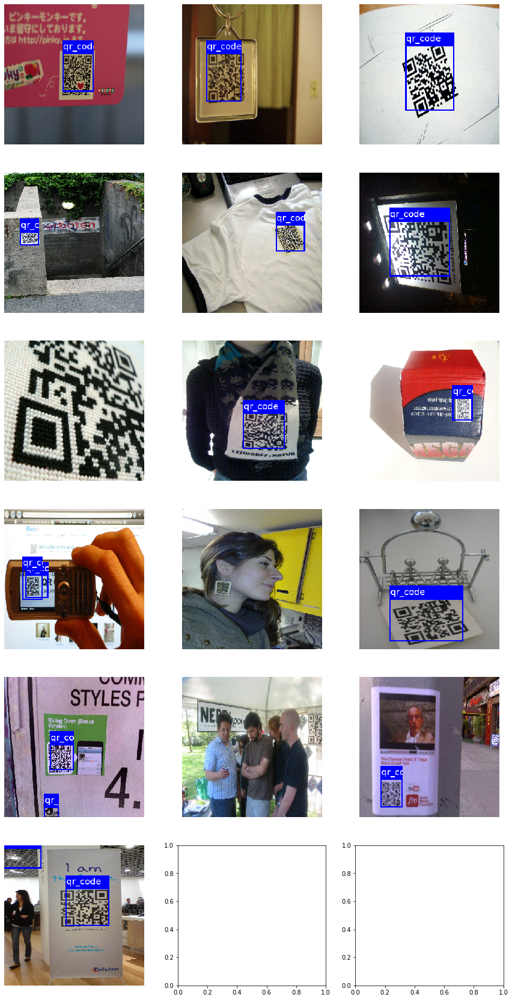

In [11]:
model_file = 'baseline_mobilenet_pretrain.h5'
model.load_weights(model_file)

from ssd_utils.metrics import mean_AP

ground_truth, predictions = [], []
        
for x, y_true in batched_test_data:
    predictions += [output_encoder.decode(y, anchors, model)
                    for y in model(x)]
    ground_truth += [y.to_tensor() for y in y_true]

print('Validation meanAP:', mean_AP(ground_truth, predictions))

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(batched_test_data)
X, Y = next(data_iter)

for idx in range(num_display):
    x, y = X[idx], predictions[idx]
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()

### Fintetune the model on real data

In [14]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

ssd_loss = SSDLoss()
mean_AP_metric = MeanAveragePrecision()

class ValidationCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        for x, y_true in batched_test_data:
            predictions = [output_encoder.decode(y, anchors, model)
                            for y in model(x)]
            ground_truth = [y.to_tensor() for y in y_true]
            mean_AP_metric.update_state(ground_truth, predictions)
        
        logs['val_meanAP'] = mean_AP_metric.result()
        mean_AP_metric.reset_state()
        
ckpt_callback = ModelCheckpoint('baseline_mobilenet_finetuned.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        


model.load_weights('baseline_mobilenet_pretrain.h5')
model.compile(optimizer="adam", loss=ssd_loss, run_eagerly=True)

model.fit(batched_train_data, epochs=NUM_EPOCHS,
         callbacks=[ValidationCallback(), ckpt_callback])

Epoch 1/50
36/36 [==============================] - ETA: 0s - loss: 1.7665
Calculating Average Precision for class 1.0



36/36 [==============================] - 59s 2s/step - loss: 1.7665 - val_meanAP: 0.5926
Epoch 2/50
36/36 [==============================] - ETA: 0s - loss: 0.9096
Calculating Average Precision for class 1.0



36/36 [==============================] - 62s 2s/step - loss: 0.9096 - val_meanAP: 0.5823
Epoch 3/50
36/36 [==============================] - ETA: 0s - loss: 0.5819
Calculating Average Precision for class 1.0



36/36 [==============================] - 82s 2s/step - loss: 0.5819 - val_meanAP: 0.6137
Epoch 4/50
36/36 [==============================] - ETA: 0s - loss: 0.4414
Calculating Average Precision for class 1.0



36/36 [==============================] - 40s 1s/step - loss: 0.4414 - val_meanAP: 0.6804
Epoch 5/50
36/36 [==============================] - ETA: 0s - loss: 0.3674
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 696ms/step - loss: 0.3674 - val_meanAP: 0.6403
Epoch 6/50
36/36 [==============================] - ETA: 0s - loss: 0.3015
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 694ms/step - loss: 0.3015 - val_meanAP: 0.7037
Epoch 7/50
36/36 [==============================] - ETA: 0s - loss: 0.2559
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 698ms/step - loss: 0.2559 - val_meanAP: 0.7204
Epoch 8/50
36/36 [==============================] - ETA: 0s - loss: 0.2134
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 708ms/step - loss: 0.2134 - val_meanAP: 0.7018
Epoch 9/50
36/36 [==============================] - ETA: 0s - loss: 0.2107
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 700ms/step - loss: 0.2107 - val_meanAP: 0.7185
Epoch 10/50
36/36 [==============================] - ETA: 0s - loss: 0.1746
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 710ms/step - loss: 0.1746 - val_meanAP: 0.7280
Epoch 11/50
36/36 [==============================] - ETA: 0s - loss: 0.2422
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 699ms/step - loss: 0.2422 - val_meanAP: 0.7070
Epoch 12/50
36/36 [==============================] - ETA: 0s - loss: 0.1966
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 692ms/step - loss: 0.1966 - val_meanAP: 0.7197
Epoch 13/50
36/36 [==============================] - ETA: 0s - loss: 0.1802
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 699ms/step - loss: 0.1802 - val_meanAP: 0.7328
Epoch 14/50
36/36 [==============================] - ETA: 0s - loss: 0.1570
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 703ms/step - loss: 0.1570 - val_meanAP: 0.7503
Epoch 15/50
36/36 [==============================] - ETA: 0s - loss: 0.1610
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 690ms/step - loss: 0.1610 - val_meanAP: 0.7363
Epoch 16/50
36/36 [==============================] - ETA: 0s - loss: 0.1473
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 700ms/step - loss: 0.1473 - val_meanAP: 0.7264
Epoch 17/50
36/36 [==============================] - ETA: 0s - loss: 0.1312
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 712ms/step - loss: 0.1312 - val_meanAP: 0.7318
Epoch 18/50
36/36 [==============================] - ETA: 0s - loss: 0.1116
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 706ms/step - loss: 0.1116 - val_meanAP: 0.7341
Epoch 19/50
36/36 [==============================] - ETA: 0s - loss: 0.1005
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 719ms/step - loss: 0.1005 - val_meanAP: 0.7371
Epoch 20/50
36/36 [==============================] - ETA: 0s - loss: 0.0986
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 706ms/step - loss: 0.0986 - val_meanAP: 0.7464
Epoch 21/50
36/36 [==============================] - ETA: 0s - loss: 0.0865
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 703ms/step - loss: 0.0865 - val_meanAP: 0.7330
Epoch 22/50
36/36 [==============================] - ETA: 0s - loss: 0.0978
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 710ms/step - loss: 0.0978 - val_meanAP: 0.7496
Epoch 23/50
36/36 [==============================] - ETA: 0s - loss: 0.1022
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 693ms/step - loss: 0.1022 - val_meanAP: 0.7313
Epoch 24/50
36/36 [==============================] - ETA: 0s - loss: 0.1036
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 701ms/step - loss: 0.1036 - val_meanAP: 0.7373
Epoch 25/50
36/36 [==============================] - ETA: 0s - loss: 0.0897
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 699ms/step - loss: 0.0897 - val_meanAP: 0.6955
Epoch 26/50
36/36 [==============================] - ETA: 0s - loss: 0.0919
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 700ms/step - loss: 0.0919 - val_meanAP: 0.6680
Epoch 27/50
36/36 [==============================] - ETA: 0s - loss: 0.0920
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 707ms/step - loss: 0.0920 - val_meanAP: 0.7395
Epoch 28/50
36/36 [==============================] - ETA: 0s - loss: 0.0853
Calculating Average Precision for class 1.0



36/36 [==============================] - 27s 749ms/step - loss: 0.0853 - val_meanAP: 0.7331
Epoch 29/50
36/36 [==============================] - ETA: 0s - loss: 0.0764
Calculating Average Precision for class 1.0



36/36 [==============================] - 33s 913ms/step - loss: 0.0764 - val_meanAP: 0.7494
Epoch 30/50
36/36 [==============================] - ETA: 0s - loss: 0.0817
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 729ms/step - loss: 0.0817 - val_meanAP: 0.7478
Epoch 31/50
36/36 [==============================] - ETA: 0s - loss: 0.0844
Calculating Average Precision for class 1.0



36/36 [==============================] - 28s 787ms/step - loss: 0.0844 - val_meanAP: 0.7192
Epoch 32/50
36/36 [==============================] - ETA: 0s - loss: 0.0788
Calculating Average Precision for class 1.0



36/36 [==============================] - 27s 749ms/step - loss: 0.0788 - val_meanAP: 0.7445
Epoch 33/50
36/36 [==============================] - ETA: 0s - loss: 0.0716
Calculating Average Precision for class 1.0



36/36 [==============================] - 27s 738ms/step - loss: 0.0716 - val_meanAP: 0.7268
Epoch 34/50
36/36 [==============================] - ETA: 0s - loss: 0.0789
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 733ms/step - loss: 0.0789 - val_meanAP: 0.7463
Epoch 35/50
36/36 [==============================] - ETA: 0s - loss: 0.6072
Calculating Average Precision for class 1.0



36/36 [==============================] - 28s 770ms/step - loss: 0.6072 - val_meanAP: 0.4734
Epoch 36/50
36/36 [==============================] - ETA: 0s - loss: 2.2076
Calculating Average Precision for class 1.0



36/36 [==============================] - 34s 932ms/step - loss: 2.2076 - val_meanAP: 0.2138
Epoch 37/50
36/36 [==============================] - ETA: 0s - loss: 1.3653
Calculating Average Precision for class 1.0



36/36 [==============================] - 29s 806ms/step - loss: 1.3653 - val_meanAP: 0.2975
Epoch 38/50
36/36 [==============================] - ETA: 0s - loss: 0.5679
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 721ms/step - loss: 0.5679 - val_meanAP: 0.5557
Epoch 39/50
36/36 [==============================] - ETA: 0s - loss: 0.3750
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 987ms/step - loss: 0.3750 - val_meanAP: 0.6099
Epoch 40/50
36/36 [==============================] - ETA: 0s - loss: 0.3035
Calculating Average Precision for class 1.0



36/36 [==============================] - 42s 1s/step - loss: 0.3035 - val_meanAP: 0.7080
Epoch 41/50
36/36 [==============================] - ETA: 0s - loss: 0.2613
Calculating Average Precision for class 1.0



36/36 [==============================] - 29s 794ms/step - loss: 0.2613 - val_meanAP: 0.6041
Epoch 42/50
36/36 [==============================] - ETA: 0s - loss: 0.2023
Calculating Average Precision for class 1.0



36/36 [==============================] - 39s 1s/step - loss: 0.2023 - val_meanAP: 0.6934
Epoch 43/50
36/36 [==============================] - ETA: 0s - loss: 0.1770
Calculating Average Precision for class 1.0



36/36 [==============================] - 33s 910ms/step - loss: 0.1770 - val_meanAP: 0.6796
Epoch 44/50
36/36 [==============================] - ETA: 0s - loss: 0.1543
Calculating Average Precision for class 1.0



36/36 [==============================] - 29s 819ms/step - loss: 0.1543 - val_meanAP: 0.6803
Epoch 45/50
36/36 [==============================] - ETA: 0s - loss: 0.1470
Calculating Average Precision for class 1.0



36/36 [==============================] - 35s 960ms/step - loss: 0.1470 - val_meanAP: 0.7097
Epoch 46/50
36/36 [==============================] - ETA: 0s - loss: 0.1321
Calculating Average Precision for class 1.0



36/36 [==============================] - 44s 1s/step - loss: 0.1321 - val_meanAP: 0.7067
Epoch 47/50
36/36 [==============================] - ETA: 0s - loss: 0.1309
Calculating Average Precision for class 1.0



36/36 [==============================] - 44s 1s/step - loss: 0.1309 - val_meanAP: 0.7180
Epoch 48/50
36/36 [==============================] - ETA: 0s - loss: 0.1085
Calculating Average Precision for class 1.0



36/36 [==============================] - 32s 885ms/step - loss: 0.1085 - val_meanAP: 0.7169
Epoch 49/50
36/36 [==============================] - ETA: 0s - loss: 0.1125
Calculating Average Precision for class 1.0



36/36 [==============================] - 25s 707ms/step - loss: 0.1125 - val_meanAP: 0.7084
Epoch 50/50
36/36 [==============================] - ETA: 0s - loss: 0.1090
Calculating Average Precision for class 1.0



36/36 [==============================] - 26s 717ms/step - loss: 0.1090 - val_meanAP: 0.7141



Calculating Average Precision for class 1.0



Validation meanAP: 0.7502885460892988


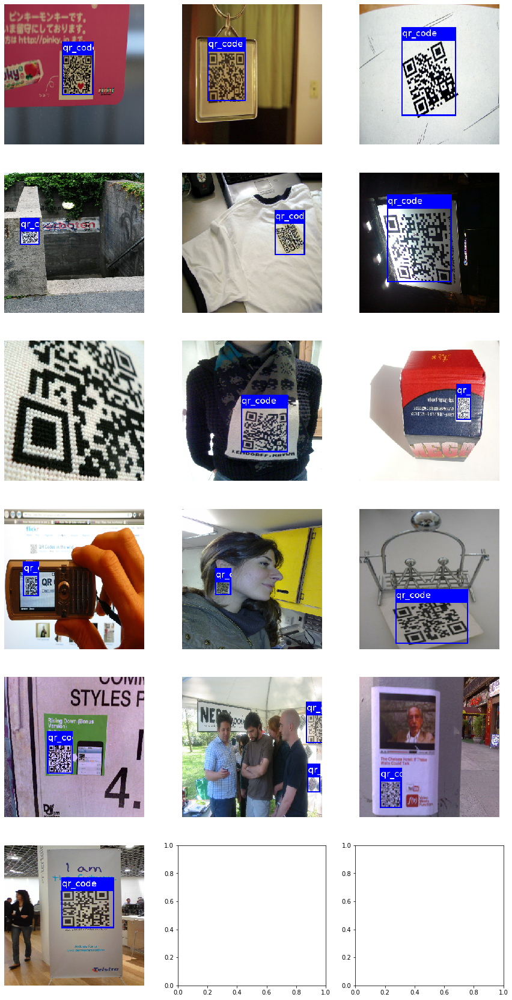

In [15]:
model_file = 'baseline_mobilenet_finetuned.h5'
model.load_weights(model_file)

from ssd_utils.metrics import mean_AP

ground_truth, predictions = [], []
        
for x, y_true in batched_test_data:
    predictions += [output_encoder.decode(y, anchors, model)
                    for y in model(x)]
    ground_truth += [y.to_tensor() for y in y_true]

print('Validation meanAP:', mean_AP(ground_truth, predictions))

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(batched_test_data)
X, Y = next(data_iter)

for idx in range(num_display):
    x, y = X[idx], predictions[idx]
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()

## ResNet50

### Instantiate the model

In [16]:
from ssd_utils.networks.ssd_resnet50 import SSDResNet50

model = SSDResNet50(num_classes=len(CLASSES), name='ssd_resnet50')

### Encode the data for this model

In [17]:
from ssd_utils import output_encoder

anchors = model.get_anchors(image_shape=IMAGE_SIZE + (3,))

def encode(image, boxes):
    encoded = output_encoder.encode(boxes,
                                    anchors=anchors,
                                    model=model)
    return image, encoded

data_iter = iter(train_data)
x, y = next(data_iter)
x, y = read_and_resize_image(x, y, new_size=IMAGE_SIZE)
x, y = encode(x, y.to_tensor())
print(x.shape, y.shape)

(320, 320, 3) (4500, 6)


### Create the data pipelines

In [18]:
batched_fake_data = fake_data.repeat()
batched_fake_data = batched_fake_data.shuffle(SHUFFLE_BUFFER,
                                              reshuffle_each_iteration=True)
batched_fake_data = batched_fake_data.map(lambda x, y:
                read_and_resize_image(x, y, new_size=IMAGE_SIZE))
batched_fake_data = batched_fake_data.map(lambda x, y:
                tf.py_function(encode, [x, y.to_tensor()], [tf.uint8, tf.float32]))
batched_fake_data = batched_fake_data.batch(BATCH_SIZE).prefetch(5)

batched_train_data = train_data
batched_train_data = batched_train_data.shuffle(SHUFFLE_BUFFER,
                                              reshuffle_each_iteration=True)
batched_train_data = batched_train_data.map(lambda x, y:
                read_and_resize_image(x, y, new_size=IMAGE_SIZE))
batched_train_data = batched_train_data.map(lambda x, y:
                tf.py_function(encode, [x, y.to_tensor()], [tf.uint8, tf.float32]))
batched_train_data = batched_train_data.batch(BATCH_SIZE).prefetch(5)


batched_test_data = test_data.map(lambda x, y:
                read_and_resize_image(x, y, new_size=IMAGE_SIZE))
batched_test_data = batched_test_data.batch(BATCH_SIZE)

### Pretrain the model on fake data

In [19]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

ssd_loss = SSDLoss()
mean_AP_metric = MeanAveragePrecision()

class ValidationCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        for x, y_true in batched_test_data:
            predictions = [output_encoder.decode(y, anchors, model)
                            for y in model(x)]
            ground_truth = [y.to_tensor() for y in y_true]
            mean_AP_metric.update_state(ground_truth, predictions)
        
        logs['val_meanAP'] = mean_AP_metric.result()
        mean_AP_metric.reset_state()
        
ckpt_callback = ModelCheckpoint('baseline_resnet50_pretrain.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer="adam", loss=ssd_loss, run_eagerly=True)

model.fit(batched_fake_data, epochs=NUM_EPOCHS, steps_per_epoch=30,
         callbacks=[ValidationCallback(), ckpt_callback])

Epoch 1/50
30/30 [==============================] - ETA: 0s - loss: 14.1895
Calculating Average Precision for class 1.0



30/30 [==============================] - 27s 901ms/step - loss: 14.1895 - val_meanAP: 0.0000e+00
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 2.9652
Calculating Average Precision for class 1.0



30/30 [==============================] - 29s 951ms/step - loss: 2.9652 - val_meanAP: 0.0171
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 2.0306
Calculating Average Precision for class 1.0



30/30 [==============================] - 29s 961ms/step - loss: 2.0306 - val_meanAP: 0.0822
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 1.4724
Calculating Average Precision for class 1.0



30/30 [==============================] - 27s 915ms/step - loss: 1.4724 - val_meanAP: 0.1484
Epoch 5/50
30/30 [==============================] - ETA: 0s - loss: 1.2078
Calculating Average Precision for class 1.0



30/30 [==============================] - 29s 962ms/step - loss: 1.2078 - val_meanAP: 0.2857
Epoch 6/50
30/30 [==============================] - ETA: 0s - loss: 0.9479
Calculating Average Precision for class 1.0



30/30 [==============================] - 29s 964ms/step - loss: 0.9479 - val_meanAP: 0.4732
Epoch 7/50
30/30 [==============================] - ETA: 0s - loss: 0.9134
Calculating Average Precision for class 1.0



30/30 [==============================] - 28s 948ms/step - loss: 0.9134 - val_meanAP: 0.4323
Epoch 8/50
30/30 [==============================] - ETA: 0s - loss: 0.8327
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 855ms/step - loss: 0.8327 - val_meanAP: 0.4230
Epoch 9/50
30/30 [==============================] - ETA: 0s - loss: 0.8412
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 872ms/step - loss: 0.8412 - val_meanAP: 0.4360
Epoch 10/50
30/30 [==============================] - ETA: 0s - loss: 0.6104
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 870ms/step - loss: 0.6104 - val_meanAP: 0.4050
Epoch 11/50
30/30 [==============================] - ETA: 0s - loss: 0.4929
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 852ms/step - loss: 0.4929 - val_meanAP: 0.3888
Epoch 12/50
30/30 [==============================] - ETA: 0s - loss: 0.4933
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 860ms/step - loss: 0.4933 - val_meanAP: 0.3948
Epoch 13/50
30/30 [==============================] - ETA: 0s - loss: 0.4791
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 852ms/step - loss: 0.4791 - val_meanAP: 0.3491
Epoch 14/50
30/30 [==============================] - ETA: 0s - loss: 0.4357
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 871ms/step - loss: 0.4357 - val_meanAP: 0.3711
Epoch 15/50
30/30 [==============================] - ETA: 0s - loss: 0.4470
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 860ms/step - loss: 0.4470 - val_meanAP: 0.3987
Epoch 16/50
30/30 [==============================] - ETA: 0s - loss: 0.3839
Calculating Average Precision for class 1.0



30/30 [==============================] - 27s 886ms/step - loss: 0.3839 - val_meanAP: 0.3631
Epoch 17/50
30/30 [==============================] - ETA: 0s - loss: 0.3826
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 859ms/step - loss: 0.3826 - val_meanAP: 0.3227
Epoch 18/50
30/30 [==============================] - ETA: 0s - loss: 0.3396
Calculating Average Precision for class 1.0



30/30 [==============================] - 25s 829ms/step - loss: 0.3396 - val_meanAP: 0.3362
Epoch 19/50
30/30 [==============================] - ETA: 0s - loss: 0.3566
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 853ms/step - loss: 0.3566 - val_meanAP: 0.3584
Epoch 20/50
30/30 [==============================] - ETA: 0s - loss: 0.3046
Calculating Average Precision for class 1.0



30/30 [==============================] - 29s 952ms/step - loss: 0.3046 - val_meanAP: 0.3587
Epoch 21/50
30/30 [==============================] - ETA: 0s - loss: 0.3147
Calculating Average Precision for class 1.0



30/30 [==============================] - 25s 840ms/step - loss: 0.3147 - val_meanAP: 0.3242
Epoch 22/50
30/30 [==============================] - ETA: 0s - loss: 0.3636
Calculating Average Precision for class 1.0



30/30 [==============================] - 26s 874ms/step - loss: 0.3636 - val_meanAP: 0.3255
Epoch 23/50
30/30 [==============================] - ETA: 0s - loss: 0.3295
Calculating Average Precision for class 1.0



30/30 [==============================] - 25s 834ms/step - loss: 0.3295 - val_meanAP: 0.3850
Epoch 24/50
30/30 [==============================] - ETA: 0s - loss: 0.2917
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 809ms/step - loss: 0.2917 - val_meanAP: 0.3424
Epoch 25/50
30/30 [==============================] - ETA: 0s - loss: 0.3270
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 809ms/step - loss: 0.3270 - val_meanAP: 0.3500
Epoch 26/50
30/30 [==============================] - ETA: 0s - loss: 0.2742
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 810ms/step - loss: 0.2742 - val_meanAP: 0.4112
Epoch 27/50
30/30 [==============================] - ETA: 0s - loss: 0.2803
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 808ms/step - loss: 0.2803 - val_meanAP: 0.3646
Epoch 28/50
30/30 [==============================] - ETA: 0s - loss: 0.2490
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 806ms/step - loss: 0.2490 - val_meanAP: 0.3412
Epoch 29/50
30/30 [==============================] - ETA: 0s - loss: 0.2457
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 812ms/step - loss: 0.2457 - val_meanAP: 0.3478
Epoch 30/50
30/30 [==============================] - ETA: 0s - loss: 0.2268
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 810ms/step - loss: 0.2268 - val_meanAP: 0.3482
Epoch 31/50
30/30 [==============================] - ETA: 0s - loss: 0.2241
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 808ms/step - loss: 0.2241 - val_meanAP: 0.3350
Epoch 32/50
30/30 [==============================] - ETA: 0s - loss: 0.2188
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 811ms/step - loss: 0.2188 - val_meanAP: 0.3116
Epoch 33/50
30/30 [==============================] - ETA: 0s - loss: 0.2116
Calculating Average Precision for class 1.0



30/30 [==============================] - 25s 818ms/step - loss: 0.2116 - val_meanAP: 0.3440
Epoch 34/50
30/30 [==============================] - ETA: 0s - loss: 0.1982
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 807ms/step - loss: 0.1982 - val_meanAP: 0.3548
Epoch 35/50
30/30 [==============================] - ETA: 0s - loss: 0.1987
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 798ms/step - loss: 0.1987 - val_meanAP: 0.3737
Epoch 36/50
30/30 [==============================] - ETA: 0s - loss: 0.1947
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 800ms/step - loss: 0.1947 - val_meanAP: 0.3736
Epoch 37/50
30/30 [==============================] - ETA: 0s - loss: 0.1692
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 796ms/step - loss: 0.1692 - val_meanAP: 0.3300
Epoch 38/50
30/30 [==============================] - ETA: 0s - loss: 0.1891
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 796ms/step - loss: 0.1891 - val_meanAP: 0.3491
Epoch 39/50
30/30 [==============================] - ETA: 0s - loss: 0.1817
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 791ms/step - loss: 0.1817 - val_meanAP: 0.3290
Epoch 40/50
30/30 [==============================] - ETA: 0s - loss: 0.2149
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 792ms/step - loss: 0.2149 - val_meanAP: 0.3153
Epoch 41/50
30/30 [==============================] - ETA: 0s - loss: 0.1905
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 788ms/step - loss: 0.1905 - val_meanAP: 0.3016
Epoch 42/50
30/30 [==============================] - ETA: 0s - loss: 0.1846
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 798ms/step - loss: 0.1846 - val_meanAP: 0.3931
Epoch 43/50
30/30 [==============================] - ETA: 0s - loss: 0.1546
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 796ms/step - loss: 0.1546 - val_meanAP: 0.3914
Epoch 44/50
30/30 [==============================] - ETA: 0s - loss: 0.1659
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 791ms/step - loss: 0.1659 - val_meanAP: 0.3357
Epoch 45/50
30/30 [==============================] - ETA: 0s - loss: 0.1648
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 789ms/step - loss: 0.1648 - val_meanAP: 0.3194
Epoch 46/50
30/30 [==============================] - ETA: 0s - loss: 0.1676
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 790ms/step - loss: 0.1676 - val_meanAP: 0.3057
Epoch 47/50
30/30 [==============================] - ETA: 0s - loss: 0.1565
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 790ms/step - loss: 0.1565 - val_meanAP: 0.2960
Epoch 48/50
30/30 [==============================] - ETA: 0s - loss: 0.1678
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 789ms/step - loss: 0.1678 - val_meanAP: 0.3109
Epoch 49/50
30/30 [==============================] - ETA: 0s - loss: 0.1727
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 793ms/step - loss: 0.1727 - val_meanAP: 0.3218
Epoch 50/50
30/30 [==============================] - ETA: 0s - loss: 0.1858
Calculating Average Precision for class 1.0



30/30 [==============================] - 24s 798ms/step - loss: 0.1858 - val_meanAP: 0.3881



Calculating Average Precision for class 1.0



Validation meanAP: 0.4732113377378532


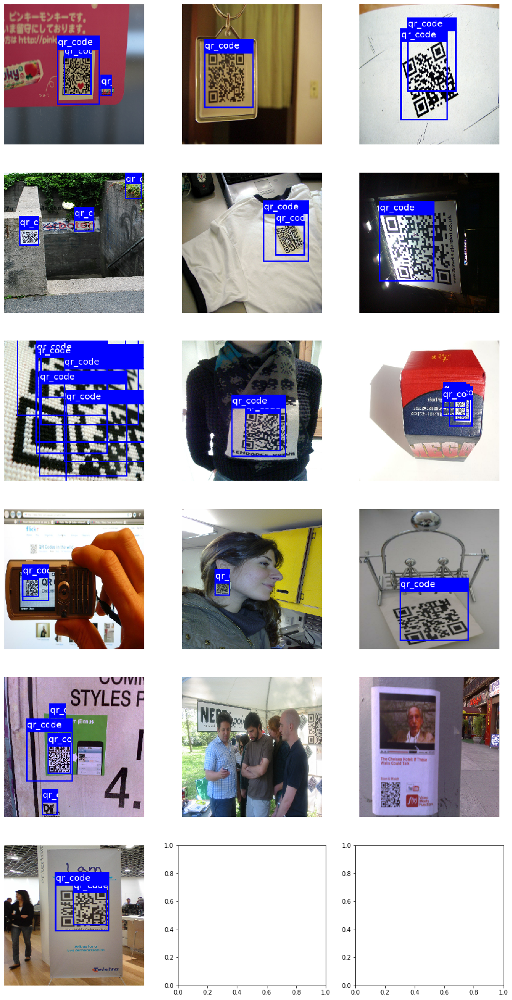

In [20]:
model_file = 'baseline_resnet50_pretrain.h5'
model.load_weights(model_file)

from ssd_utils.metrics import mean_AP

ground_truth, predictions = [], []
        
for x, y_true in batched_test_data:
    predictions += [output_encoder.decode(y, anchors, model)
                    for y in model(x)]
    ground_truth += [y.to_tensor() for y in y_true]

print('Validation meanAP:', mean_AP(ground_truth, predictions))

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(batched_test_data)
X, Y = next(data_iter)

for idx in range(num_display):
    x, y = X[idx], predictions[idx]
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()

### Fintetune the model on real data

In [21]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

ssd_loss = SSDLoss()
mean_AP_metric = MeanAveragePrecision()

class ValidationCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        for x, y_true in batched_test_data:
            predictions = [output_encoder.decode(y, anchors, model)
                            for y in model(x)]
            ground_truth = [y.to_tensor() for y in y_true]
            mean_AP_metric.update_state(ground_truth, predictions)
        
        logs['val_meanAP'] = mean_AP_metric.result()
        mean_AP_metric.reset_state()
        
ckpt_callback = ModelCheckpoint('baseline_resnet50_finetuned.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        


model.load_weights('baseline_resnet50_pretrain.h5')
model.compile(optimizer="adam", loss=ssd_loss, run_eagerly=True)

model.fit(batched_train_data, epochs=NUM_EPOCHS,
         callbacks=[ValidationCallback(), ckpt_callback])

Epoch 1/50
36/36 [==============================] - ETA: 0s - loss: 2.8333
Calculating Average Precision for class 1.0



36/36 [==============================] - 62s 2s/step - loss: 2.8333 - val_meanAP: 0.1097
Epoch 2/50
36/36 [==============================] - ETA: 0s - loss: 1.3869
Calculating Average Precision for class 1.0



36/36 [==============================] - 46s 1s/step - loss: 1.3869 - val_meanAP: 0.5227
Epoch 3/50
36/36 [==============================] - ETA: 0s - loss: 1.0447
Calculating Average Precision for class 1.0


/home/leonardo/Projects/MS/ssd_utils/metrics.py:18: RuntimeWarning: overflow encountered in float_scalars
  sum_areas = (xmax1-xmin1)*(ymax1-ymin1) + (xmax2-xmin2)*(ymax2-ymin2)



36/36 [==============================] - 37s 1s/step - loss: 1.0447 - val_meanAP: 0.4679
Epoch 4/50
36/36 [==============================] - ETA: 0s - loss: 0.8296
Calculating Average Precision for class 1.0



36/36 [==============================] - 38s 1s/step - loss: 0.8296 - val_meanAP: 0.6958
Epoch 5/50
36/36 [==============================] - ETA: 0s - loss: 0.6323
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 0.6323 - val_meanAP: 0.6776
Epoch 6/50
36/36 [==============================] - ETA: 0s - loss: 0.5360
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 0.5360 - val_meanAP: 0.6873
Epoch 7/50
36/36 [==============================] - ETA: 0s - loss: 0.4376
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 0.4376 - val_meanAP: 0.6752
Epoch 8/50
36/36 [==============================] - ETA: 0s - loss: 0.3377
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 0.3377 - val_meanAP: 0.6696
Epoch 9/50
36/36 [==============================] - ETA: 0s - loss: 0.3704
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3704 - val_meanAP: 0.6805
Epoch 10/50
36/36 [==============================] - ETA: 0s - loss: 0.4486
Calculating Average Precision for class 1.0



36/36 [==============================] - 38s 1s/step - loss: 0.4486 - val_meanAP: 0.7302
Epoch 11/50
36/36 [==============================] - ETA: 0s - loss: 0.3594
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3594 - val_meanAP: 0.6780
Epoch 12/50
36/36 [==============================] - ETA: 0s - loss: 0.2919
Calculating Average Precision for class 1.0



36/36 [==============================] - 38s 1s/step - loss: 0.2919 - val_meanAP: 0.6976
Epoch 13/50
36/36 [==============================] - ETA: 0s - loss: 0.2683
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.2683 - val_meanAP: 0.6764
Epoch 14/50
36/36 [==============================] - ETA: 0s - loss: 0.2496
Calculating Average Precision for class 1.0



36/36 [==============================] - 38s 1s/step - loss: 0.2496 - val_meanAP: 0.6704
Epoch 15/50
36/36 [==============================] - ETA: 0s - loss: 0.2375
Calculating Average Precision for class 1.0



36/36 [==============================] - 38s 1s/step - loss: 0.2375 - val_meanAP: 0.6853
Epoch 16/50
36/36 [==============================] - ETA: 0s - loss: 0.1992
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.1992 - val_meanAP: 0.6964
Epoch 17/50
36/36 [==============================] - ETA: 0s - loss: 0.2985
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.2985 - val_meanAP: 0.6554
Epoch 18/50
36/36 [==============================] - ETA: 0s - loss: 0.4241
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.4241 - val_meanAP: 0.3034
Epoch 19/50
36/36 [==============================] - ETA: 0s - loss: 0.3284
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3284 - val_meanAP: 0.5371
Epoch 20/50
36/36 [==============================] - ETA: 0s - loss: 0.2772
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.2772 - val_meanAP: 0.4161
Epoch 21/50
36/36 [==============================] - ETA: 0s - loss: 1.9515
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1000ms/step - loss: 1.9515 - val_meanAP: 0.0000e+00
Epoch 22/50
36/36 [==============================] - ETA: 0s - loss: 3.6132
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 3.6132 - val_meanAP: 0.0000e+00
Epoch 23/50
36/36 [==============================] - ETA: 0s - loss: 3.4585
Calculating Average Precision for class 1.0


/home/leonardo/Projects/MS/ssd_utils/metrics.py:18: RuntimeWarning: invalid value encountered in float_scalars
  sum_areas = (xmax1-xmin1)*(ymax1-ymin1) + (xmax2-xmin2)*(ymax2-ymin2)



36/36 [==============================] - 39s 1s/step - loss: 3.4585 - val_meanAP: 6.0335e-06
Epoch 24/50
36/36 [==============================] - ETA: 0s - loss: 2.7004
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 2.7004 - val_meanAP: 0.0295
Epoch 25/50
36/36 [==============================] - ETA: 0s - loss: 1.7690
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 1.7690 - val_meanAP: 0.0994
Epoch 26/50
36/36 [==============================] - ETA: 0s - loss: 1.1889
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 1.1889 - val_meanAP: 0.5061
Epoch 27/50
36/36 [==============================] - ETA: 0s - loss: 0.9628
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.9628 - val_meanAP: 0.5665
Epoch 28/50
36/36 [==============================] - ETA: 0s - loss: 0.9396
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.9396 - val_meanAP: 0.5813
Epoch 29/50
36/36 [==============================] - ETA: 0s - loss: 0.8344
Calculating Average Precision for class 1.0



36/36 [==============================] - 38s 1s/step - loss: 0.8344 - val_meanAP: 0.5863
Epoch 30/50
36/36 [==============================] - ETA: 0s - loss: 0.8549
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.8549 - val_meanAP: 0.5800
Epoch 31/50
36/36 [==============================] - ETA: 0s - loss: 0.6511
Calculating Average Precision for class 1.0



36/36 [==============================] - 45s 1s/step - loss: 0.6511 - val_meanAP: 0.6205
Epoch 32/50
36/36 [==============================] - ETA: 0s - loss: 0.7146
Calculating Average Precision for class 1.0



36/36 [==============================] - 44s 1s/step - loss: 0.7146 - val_meanAP: 0.6238
Epoch 33/50
36/36 [==============================] - ETA: 0s - loss: 0.5004
Calculating Average Precision for class 1.0



36/36 [==============================] - 46s 1s/step - loss: 0.5004 - val_meanAP: 0.6105
Epoch 34/50
36/36 [==============================] - ETA: 0s - loss: 0.4523
Calculating Average Precision for class 1.0



36/36 [==============================] - 38s 1s/step - loss: 0.4523 - val_meanAP: 0.6145
Epoch 35/50
36/36 [==============================] - ETA: 0s - loss: 0.4378
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.4378 - val_meanAP: 0.6226
Epoch 36/50
36/36 [==============================] - ETA: 0s - loss: 0.3943
Calculating Average Precision for class 1.0



36/36 [==============================] - 48s 1s/step - loss: 0.3943 - val_meanAP: 0.6069
Epoch 37/50
36/36 [==============================] - ETA: 0s - loss: 0.3877
Calculating Average Precision for class 1.0



36/36 [==============================] - 40s 1s/step - loss: 0.3877 - val_meanAP: 0.5885
Epoch 38/50
36/36 [==============================] - ETA: 0s - loss: 0.3451
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3451 - val_meanAP: 0.6106
Epoch 39/50
36/36 [==============================] - ETA: 0s - loss: 0.3311
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3311 - val_meanAP: 0.6355
Epoch 40/50
36/36 [==============================] - ETA: 0s - loss: 0.3065
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3065 - val_meanAP: 0.6191
Epoch 41/50
36/36 [==============================] - ETA: 0s - loss: 0.3094
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 0.3094 - val_meanAP: 0.6329
Epoch 42/50
36/36 [==============================] - ETA: 0s - loss: 0.3110
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3110 - val_meanAP: 0.6295
Epoch 43/50
36/36 [==============================] - ETA: 0s - loss: 0.2828
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.2828 - val_meanAP: 0.6416
Epoch 44/50
36/36 [==============================] - ETA: 0s - loss: 0.2554
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.2554 - val_meanAP: 0.6375
Epoch 45/50
36/36 [==============================] - ETA: 0s - loss: 0.2429
Calculating Average Precision for class 1.0



36/36 [==============================] - 55s 2s/step - loss: 0.2429 - val_meanAP: 0.6299
Epoch 46/50
36/36 [==============================] - ETA: 0s - loss: 0.2549
Calculating Average Precision for class 1.0



36/36 [==============================] - 41s 1s/step - loss: 0.2549 - val_meanAP: 0.6277
Epoch 47/50
36/36 [==============================] - ETA: 0s - loss: 0.2327
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.2327 - val_meanAP: 0.6290
Epoch 48/50
36/36 [==============================] - ETA: 0s - loss: 0.3194
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.3194 - val_meanAP: 0.5880
Epoch 49/50
36/36 [==============================] - ETA: 0s - loss: 0.6611
Calculating Average Precision for class 1.0



36/36 [==============================] - 36s 1s/step - loss: 0.6611 - val_meanAP: 0.6334
Epoch 50/50
36/36 [==============================] - ETA: 0s - loss: 0.4203
Calculating Average Precision for class 1.0



36/36 [==============================] - 37s 1s/step - loss: 0.4203 - val_meanAP: 0.5945



Calculating Average Precision for class 1.0



Validation meanAP: 0.7301905920382689


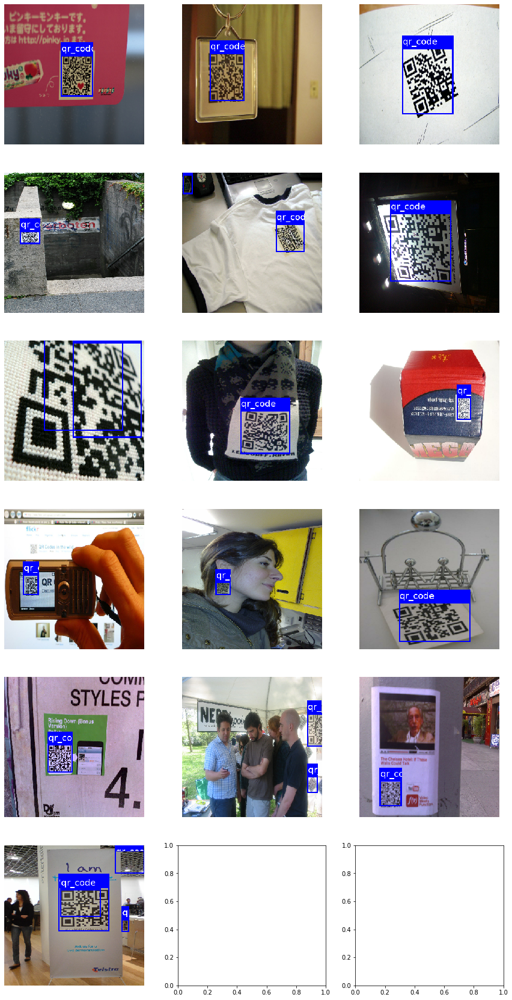

In [22]:
model_file = 'baseline_resnet50_finetuned.h5'
model.load_weights(model_file)

from ssd_utils.metrics import mean_AP

ground_truth, predictions = [], []
        
for x, y_true in batched_test_data:
    predictions += [output_encoder.decode(y, anchors, model)
                    for y in model(x)]
    ground_truth += [y.to_tensor() for y in y_true]

print('Validation meanAP:', mean_AP(ground_truth, predictions))

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(batched_test_data)
X, Y = next(data_iter)

for idx in range(num_display):
    x, y = X[idx], predictions[idx]
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()